# Агентный цикл генерации изображений

В этой лабораторной работе мы создадим автоматический генератор изображений, основанный на **агентном цикле**. Он будет итерационно улучшать генерируемое изображение на основе обратной связи от визуальной LLM.

Основная идея в том, что на вход мы будет подавать какую-то простую концепцию - *счастье* или *сложность*. На основе этой концепции:

* LLM генерирует промпт для рисования, продумывая, как лучше отобразить концепцию
* YandexART генерирует изображение
* Визуальная нейросеть VLM оценивает, насколько изображение соответствует концепции, и предлагает улучшения

После этого цикл повторяется.

## Архитектура решения

```
┌─────────────┐     ┌─────────────┐     ┌─────────────┐
│ Концепция   │────▶│ LLM создаёт │────▶│ YandexART   │
│ (понятие)   │     │ промпт      │     │ рисует      │
└─────────────┘     └─────────────┘     └─────────────┘
                                              │
                                              ▼
┌─────────────┐     ┌─────────────┐     ┌─────────────┐
│ LLM улучшает│◀────│ Визуальная  │◀────│ Изображение │
│ промпт      │ Нет │ LLM (Gemma) │     │             │
└─────────────┘     └─────────────┘     └─────────────┘
       │                  │ Да
       │                  ▼
       └────────────▶ Готово!
```

Установим необходимые библиотеки:

In [ ]:
%pip install --upgrade yandex-ai-studio-sdk openai python-dotenv Pillow

**ВНИМАНИЕ**: После установки библиотек рекомендуется перезапустить Kernel ноутбука.

### Авторизация

Для авторизации в облаке для начала получим необходимые данные в файле `.env`. Возможно, вам потребуется создать или загрузить файл вручную, или установить значение переменных `folder_id` и `api_key` ниже в программе. 

In [ ]:
!curl -o .env {{url_of_dotenv_file}}\n

In [1]:
import os
import io
import base64
from dotenv import load_dotenv
from IPython.display import Markdown, display, Image
from PIL import Image as PILImage

load_dotenv()

folder_id = os.environ["folder_id"]
api_key = os.environ["api_key"]

def printx(string):
    display(Markdown(string))

print(f"✅ Авторизация настроена (folder_id: {folder_id[:8]}...)")

✅ Авторизация настроена (folder_id: b1gbicod...)


---

## Шаг 1: Инициализация клиентов

Создадим клиентов для работы с Yandex Cloud AI:

In [72]:
from openai import OpenAI
from yandex_ai_studio_sdk import AIStudio

# SDK для YandexART
sdk = AIStudio(
    folder_id=folder_id,
    auth=api_key
)

# OpenAI-совместимый клиент для Chat Completion / Responses API
client = OpenAI(
    base_url="https://ai.api.cloud.yandex.net/v1",
    api_key=api_key,
    project=folder_id
)

# Модели
art_model = sdk.models.image_generation('yandex-art')
gpt_model_uri = f"gpt://{folder_id}/qwen3-235b-a22b-fp8/latest"
vision_model_uri = f"gpt://{folder_id}/gemma-3-27b-it/latest"

print("✅ Клиенты инициализированы")

✅ Клиенты инициализированы


---

## Шаг 2: Вспомогательные функции

Создадим функции для запроса к моделям генерации текста и изображений.

> **ВАЖНО**: На настоящий момент мультимодальный вход (картинка + текст) поддерживается только в более старом Chat Completion API. Поэтому мы используем его, в соответствии с [этим примером](https://yandex.cloud/ru/docs/ai-studio/operations/generation/multimodels-request)

In [58]:
def generate_image(prompt):
    op = art_model.configure(width_ratio=1, height_ratio=1).run_deferred(prompt)
    res = op.wait()
    image = PILImage.open(io.BytesIO(res.image_bytes))
    return image

def image_to_base64(image):
    buffered = io.BytesIO()
    image.save(buffered, format="JPEG")
    return base64.b64encode(buffered.getvalue()).decode()

def get_content(prompt, image=None):
    if image:
        image_b64 = image_to_base64(image)
        return [
                    {
                        "type": "text",
                        "text": prompt
                    },
                    {
                        "type": "image_url",
                        "image_url": { "url" : f"data:image/jpeg;base64,{image_b64}" }
                    }
        ]
    else:
        return prompt

def gpt(prompt, model_uri=gpt_model_uri, image=None):
    response = client.chat.completions.create(
        model=model_uri,
        messages=[{"role": "user", "content": get_content(prompt, image)}]
    )
    return response.choices[0].message.content

Проверим, как работают эти функции:

In [ ]:
concept = "счастье"

## сгенерируйте промпт для иллюстрации концепта "счастье"


Счастливый ребёнок бежит по полю под ярким солнцем, вокруг цветы и бабочки, тёплые краски, чувство радости и свободы


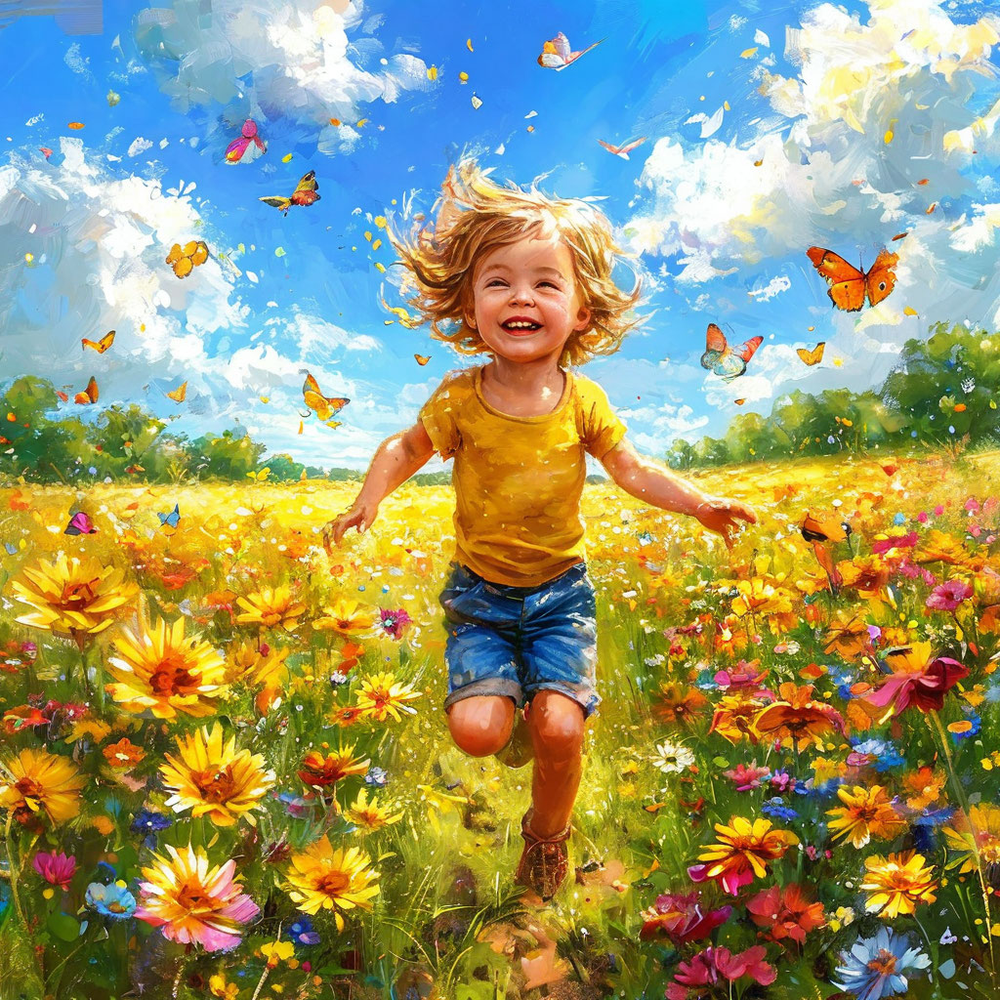

In [ ]:
## сгенерируйте изображение по этому промпту

display(img)

In [ ]:
## Проанализируйте изображение и верните рекомендации по улучшению

## Анализ изображения и связь со счастьем

Изображение очень ярко и красочно иллюстрирует концепцию счастья, делая акцент на **чистой, непосредственной радости и свободе**. Вот как это достигается:

* **Эмоция:** Главный объект - девочка, смеющаяся, с широко открытыми глазами и поднятыми руками. Эта поза и выражение лица однозначно выражают восторг и счастье.
* **Символизм:**
    * **Бабочки:** Бабочки часто ассоциируются с трансформацией, легкостью и радостью. Их обилие вокруг девочки создает ощущение волшебства и беззаботности.
    * **Цветущий луг:**  Яркие, красочные цветы символизируют жизнь, рост, красоту и позитивную энергию. Пышная зелень и разнообразие цветов усиливают ощущение радости и изобилия.
    * **Солнечный свет и голубое небо:** Светлое, солнечное небо является традиционным символом надежды, оптимизма и счастья.
* **Поза:** Девочка бежит, раскинув руки, демонстрируя свободу и желание окунуться в этот счастливый момент.  Ее движение вперед символизирует оптимизм и стре

---

## Шаг 3: Добавляем структурный ответ

Для того, чтобы получать ответ от визуальной модели в структурированном виде, а также получить какой-то формальный критерий завершения итераций улучшения, будем использовать **структурный ответ**. 

Нам нужно получить от модели:
- `fit` - число от 0 до 1, показывающее степень соответствия картинки понятию
- `recommendations` - список рекомендаций (можно в виде строки)

Опишем класс для представления ответа модели:


In [ ]:
from pydantic import BaseModel

## опишите класс, унаследованный от BaseModel


Расширим функцию `gpt` для возможности задания формата ответа:

In [65]:
def gpt(prompt, model_uri=gpt_model_uri, image=None, response_format=None):
    if response_format:
        response = client.chat.completions.parse(
        model=model_uri,
        messages=[{"role": "user", "content": get_content(prompt, image)}],
        response_format=response_format
        )
        return response.choices[0].message.parsed
    else:
        response = client.chat.completions.parse(
        model=model_uri,
        messages=[{"role": "user", "content": get_content(prompt, image)}]
        )
        return response.choices[0].message.content

In [ ]:
## Проанализируйте, насколько изображение иллюстрирует концепт "счастье"
## и дайте рекомендации по улучшению изображения с использованием
## response_format для структурного ответа

fit=0.9 recommendations='Изображение очень хорошо передает концепт счастья. Яркие цвета (желтый, синий), яркое солнце, бабочки, бегущий ребенок с искренней улыбкой – все это символы радости и беззаботности. Можно было бы немного добавить деталей, которые указывают на межличностные отношения (например, присутствие родителя или друга), чтобы ещё глубже раскрыть тему счастья, но это не критично. Изображение уже достаточно сильное.'



---

## Шаг 4: Агентный цикл

Теперь наша задача - объединить все функции в агентный цикл, который будет итеративно улучшать изображение. Для начала опишем два промпта:
* `new_prompt` - используется для первоначальной генерации изображения
* `refine_prompt` - используется для улучшения изображения после анализа VLM

В промптах можно задавать плейсхолдеры, например, `{concept}` для названия концепта и `{feedback}` для обратной связи от VLM.

In [ ]:
## напишите более подробные промпты

# промпт для начальной генерации изображения
initial_prompt = """
Тебе нужно создать промпт для нейросети генерации изображений (YandexART).
...
Концепция для визуализации: "{concept}"
...
Верни ТОЛЬКО сам промпт, без объяснений.
"""

# промпт для улучшения изображения с учётом обратной связи
refine_prompt = """
Концепция для визуализации: "{concept}"
Предыдущее изображение получило такую обратную связь: {feedback}

Создай НОВЫЙ, улучшенный промпт...
"""

# промпт для оценки изображения визуальной моделью
evaluation_prompt = """
Проанализируй, насколько изображение иллюстрирует концепт '{concept}'.
...
"""

Опишем сам агентный цикл. Определим критерии выхода из цикла:
- максимальное число итераций `max_iterations`
- порог качества `threshold`

=== Рисуем концепт 'филигранность', итерация 1


Получен промпт для генерации: Изысканная филигрань из светящихся нитей, парящая в темноте, словно хрупкая сеть звёзд; каждая линия — тоньше паутинки, переплетается в узоры древних символов и живых форм: бабочек, листьев, глаз. Стиль — гиперреализм с элементами сюрреализма, холодное биолюминесцентное свечение на фоне глубокой бархатной тьмы, контровое освещение подчёркивает объём и воздушность. Центральный ракурс, фокус на детализированной кайме перехода от материального к нематериальному, будто сама субстанция реальности соткана из дыхания.

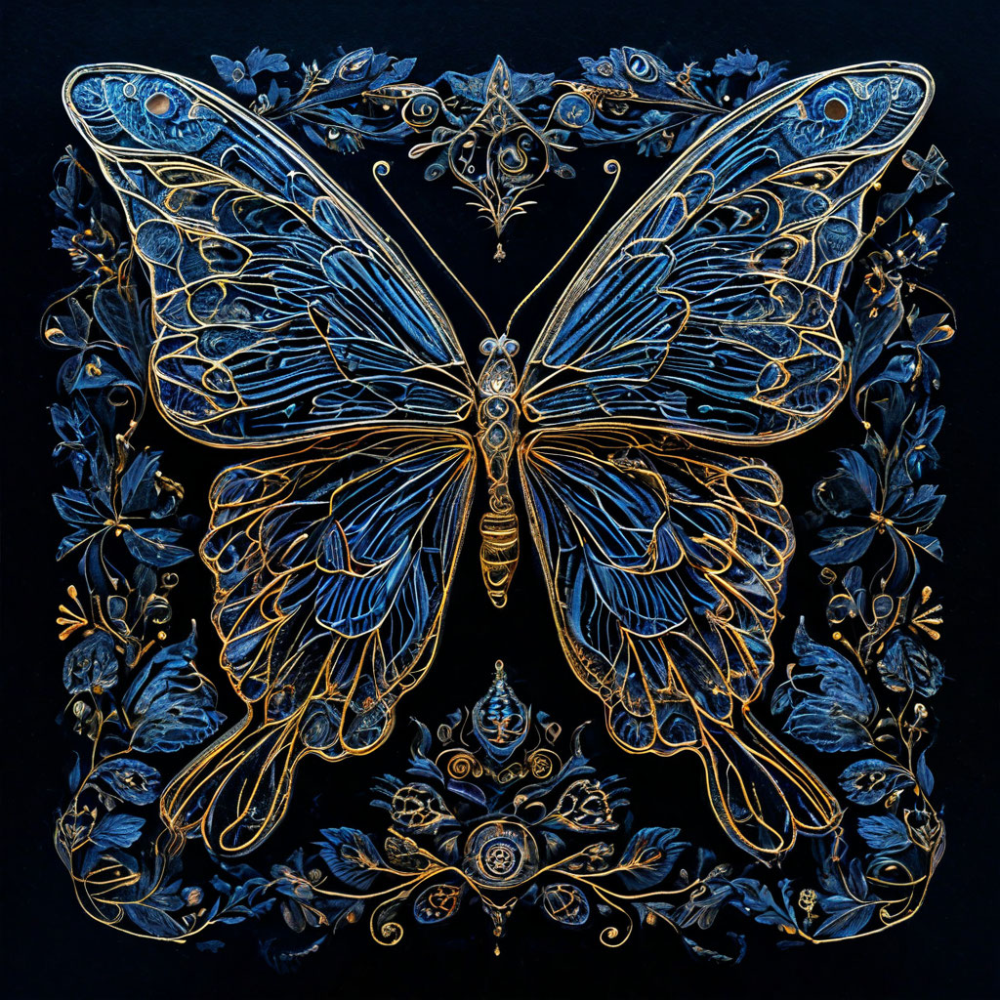

**Оценка изображения:** fit=0.9

**Рекомендации:** Изображение очень хорошо иллюстрирует концепцию филигранности.  Детализация, узор и сложность рисунка, особенно в крыльях бабочки и окружающих элементах, создают ощущение невероятной тонкости и мастерства. Возможно, для еще большего усиления эффекта можно было бы добавить элементы, подчеркивающие прозрачность или наличие множества мелких, сложных элементов, как в настоящих ювелирных изделиях.  Например, использование градиентов или текстур, имитирующих металл, могло бы добавить реалистичности и подчеркнуть филигранность.

=== Рисуем концепт 'филигранность', итерация 2


Получен промпт для генерации: Филигранная бабочка с intricately детализированными крыльями, выполненными в виде ювелирного изделия из тончайшего серебра и платины, с ажурными узорами, напоминающими кружево. Крылья полупрозрачные, с градиентами света, имитирующие переливы металла и хрусталя. Мельчайшие элементы — завитки, точки, переплетения — выписаны с микроскопической точностью, как в настоящей филиграни. Фон — туманный, приглушённый, с едва заметными геометрическими орнаментами, подчёркивающими сложность композиции. Стиль — гиперреализм с элементами ар-нуво, мягкий боковой свет создаёт игру теней и бликов, подчёркивающую объём и хрупкость. Воздушная, почти невесомая композиция, передающая ощущение тончайшей работы мастеров.

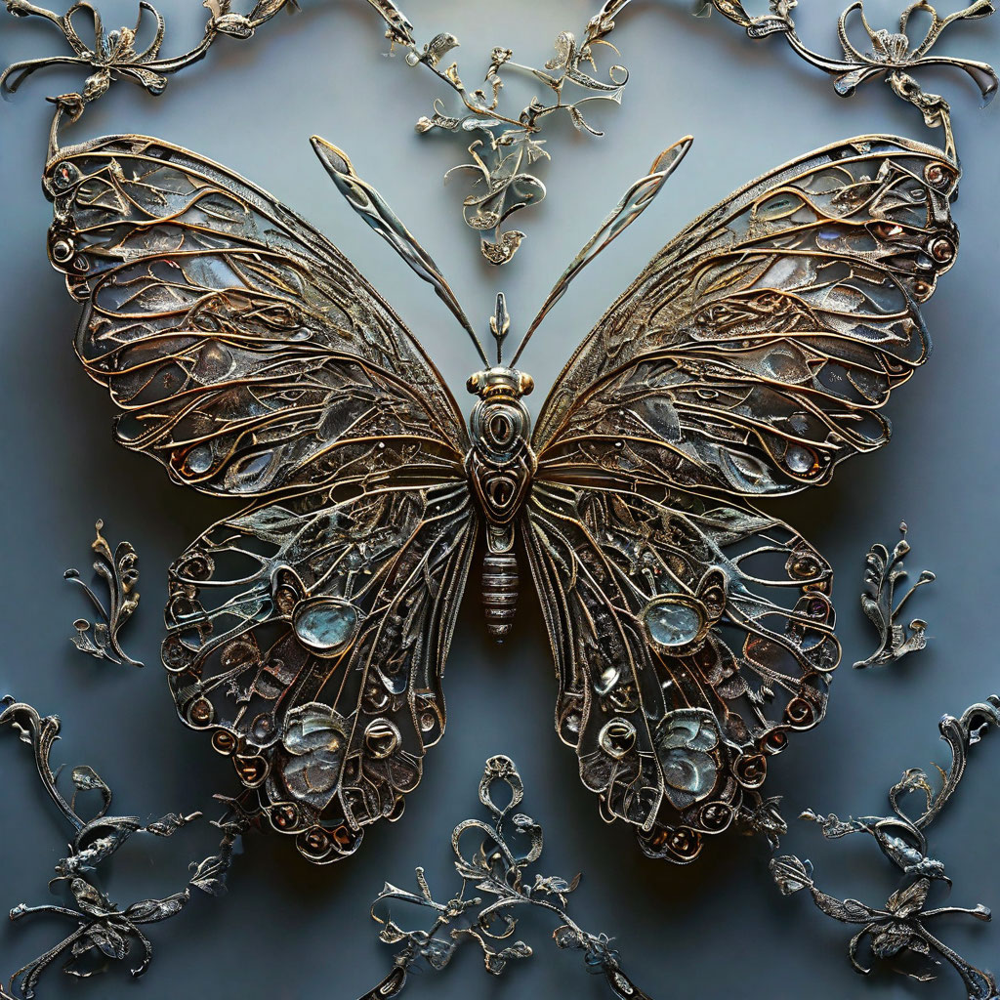

**Оценка изображения:** fit=0.95

**Рекомендации:** Изображение очень хорошо иллюстрирует концепт 'филигранность'. Сложный, ажурный узор, тонкие линии и детализированные элементы создают ощущение мастерства и изысканности.  Для еще большего соответствия можно было бы добавить больше текстуры, имитирующей различные техники филиграни (например, зернь, перегородчатая эмаль).  Также, небольшие несовершенства, характерные для ручной работы, могли бы усилить эффект 'филигранности'.

In [ ]:
def draw_concept(concept, max_iterations=5, threshold=0.95):
    # опиши основную функцию, реализующую итеративный процесс генерации 
    # и улучшения изображения

draw_concept("филигранность")

---

## Шаг 5: Экспериментируем с разными концепциями

Попробуйте несколько экспериментов с разными концепциями и посмотрите на результаты. Помогает ли агентский цикл добиваться более качественных результатов в рисовании?

> Можете попробовать добавить код для сохранения результатов генерации (включая промежуточные) на диск, чтобы потом отобрать лучшие.

Идея агентского цикла в генерации художественных произведений эксплуатировалась [Дмитрием Сошниковым](https://soshnikov.com/ru) в его работе [многоагентное рисование / VibeDraw](https://soshnikov.com/art/vibedraw/ru/)

In [ ]:
# Концепция для визуализации
# "гармония", "хаос", "время", "знание", "свобода", "баланс"

draw_concept("сложность")

---

## Заключение

В этой лабораторной работе мы создали **агентный цикл**, который:

1. **Генерирует промпт** с помощью YandexGPT на основе абстрактной концепции
2. **Создаёт изображение** с помощью Yandex ART
3. **Оценивает результат** с помощью визуальной LLM (Gemma)
4. **Итеративно улучшает** промпт на основе обратной связи

Это пример **мультимодального агента**, который использует разные AI-модели для достижения сложной творческой задачи. Можно ли назвать это полноценной многоагентной системой, и нужно ли нам изучать что-то ещё?

На самом деле, многоагентные системы дополнительно имеют:
* Память - хранят историю переписки, могут действовать с учётом истории
* Инструменты - могут вызывать дополнительные инструменты, например, вдохновляться для рисования идеями из интернет или новыми веяниями в искусстве
* Более сложное взаимодействие агентов, чем линейное, причем LLM может сама решить, с какими другими агентами ей нужно провзаимодействовать 

### Возможные улучшения прямо сейчас

- Оптимизировать пропмты
- Добавить память о всех предыдущих промптах и оценках
- Использовать более сложные критерии оценки
- Добавить параметр "стиль" для управления художественным направлением
- Реализовать параллельную генерацию нескольких вариантов с выбором лучшего